# GIS Midterm Project Update 

Our projects looks at the city of Inglewood and focuses on the developement of the SoFi Stadium in the central Eastern core of the city. We analyze physical geographic changes within the city of Inglewood by using data available from the LA County Assessors Portal. We specifically focus on the years 2010 and 2020 for reference. We do this because 2010 is a point in time prior to the announcement of the project development which we assumes to be free of any influence regarding the matter of a stadium development. We also look at the year 2020 because that is when the stadium became operational to the public. 

### Importing Libraries 

In [2]:
# to read and wrangle data
import pandas as pd

# to import data from LA Data portal
from sodapy import Socrata

# to create spatial data
import geopandas as gpd

# for basemaps
import contextily as ctx

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

import urllib.request, json 

## Creating a Socrata Client Data Frame 

In order for our data to operate through the source of the LA County Assesors Website API we first have to establish a connection directly to our notebook.

In [3]:
client = Socrata("data.lacounty.gov", None)

results = client.get("9trm-uz8i",
                    limit=50000,
                    where="taxratearea_city='INGLEWOOD' AND rollyear=2010")

df = pd.DataFrame.from_records(results)

df.sample(1)

,situszip,taxratearea_city,ain,rollyear,taxratearea,assessorid,usetype,usecode,usecodedescchar1,usecodedescchar2,...,situsdirection,situsstreet,situsunit,situscity,rowid,center_lat,center_lon,location_1,propertylocation,situszip5
8031,90301-1605,INGLEWOOD,4018017026,2010,04569,4018-017-026,R-I,0200,Residential,"Double, Duplex, or Two Units",...,W,KELSO ST,,INGLEWOOD CA,20104018017026,33.95907093,-118.36747308,"{'latitude': '33.95907093', 'longitude': '-118...",631 W KELSO ST INGLEWOOD CA 90301,90301


This is what our data looks like. 

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21281 entries, 0 to 21280
Data columns (total 51 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   situszip                   21281 non-null  object
 1   taxratearea_city           21281 non-null  object
 2   ain                        21281 non-null  object
 3   rollyear                   21281 non-null  object
 4   taxratearea                21281 non-null  object
 5   assessorid                 21281 non-null  object
 6   usetype                    21281 non-null  object
 7   usecode                    21281 non-null  object
 8   usecodedescchar1           21281 non-null  object
 9   usecodedescchar2           21281 non-null  object
 10  usecodedescchar3           21281 non-null  object
 11  usecodedescchar4           21281 non-null  object
 12  totbuildingdatalines       21281 non-null  object
 13  yearbuilt                  21281 non-null  object
 14  effect

# Going from Data Frame to Geo Data Frame

In orded to be able to plot our data points using Web mercator - we have to make sure that our data frame is able to be read by GeoPandas. 

In [5]:
gdf = gpd.GeoDataFrame(df, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(df.center_lon, df.center_lat))

In [6]:
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [7]:
gdf_web_mercator = gdf.to_crs(epsg=3857)

# Plotting Using Subplots 

Now we are able to plot our data using subplots.

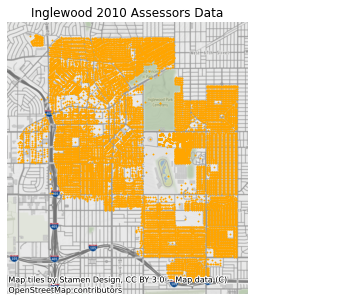

In [69]:

fig, ax = plt.subplots(figsize=(10,5))

gdf_web_mercator.plot(ax=ax, 
                      marker='X',
                      markersize=.5,
                      color='orange')

ax.axis('off')

ax.set_title('Inglewood 2010 Assessors Data')

ctx.add_basemap(ax)

In [10]:
gdf = gpd.GeoDataFrame(df, 
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(df.center_lon, df.center_lat))

In [11]:
gdf_web_mercator = gdf.to_crs(epsg=3857)

These are reproduced in the same way - but, the bottom one is color coding the building type using complicated coding that Nelson was able to figure out.

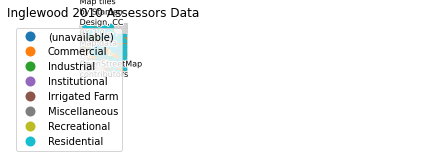

In [70]:
fig, ax = plt.subplots(figsize=(5,1))

gdf_web_mercator.plot(ax=ax,
                       marker='X',
                      markersize=4,
                      column='usecodedescchar1',
                    categorical=True,
                    legend=True)


ax.axis('off')

ax.set_title('Inglewood 2010 Assessors Data')

ctx.add_basemap(ax)

In [14]:
ctx.providers.keys()


dict_keys(['OpenStreetMap', 'OpenSeaMap', 'OpenPtMap', 'OpenTopoMap', 'OpenRailwayMap', 'OpenFireMap', 'SafeCast', 'Thunderforest', 'OpenMapSurfer', 'Hydda', 'MapBox', 'Stamen', 'Esri', 'OpenWeatherMap', 'HERE', 'FreeMapSK', 'MtbMap', 'CartoDB', 'HikeBike', 'BasemapAT', 'nlmaps', 'NASAGIBS', 'NLS', 'JusticeMap', 'Wikimedia', 'GeoportailFrance', 'OneMapSG'])

In [15]:
ctx.providers.Stamen.keys()

dict_keys(['Toner', 'TonerBackground', 'TonerHybrid', 'TonerLines', 'TonerLabels', 'TonerLite', 'Watercolor', 'Terrain', 'TerrainBackground', 'TopOSMRelief', 'TopOSMFeatures'])

## The plotted maps below show the same parcel data from the assessors portal using a different kind of base map essentially using the lab from week 5.

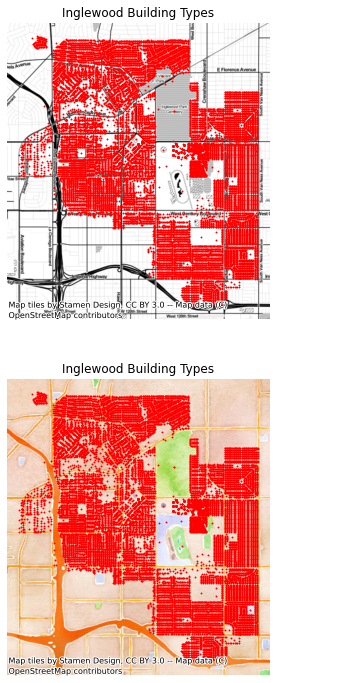

In [17]:
fig, ax = plt.subplots(2,1,figsize=(20,12))

# Note that 2 plots were requested, so ax has two items: ax[0] and ax[1]

# first map
gdf_web_mercator.plot(ax=ax[0], 
                      marker='X',
                      markersize=.5,
                      color='red')

ax[0].axis('off')
ax[0].set_title('Inglewood Building Types')

ctx.add_basemap(ax[0], source=ctx.providers.Stamen.Toner)

# second map
gdf_web_mercator.plot(ax=ax[1], 
                      marker='X',
                      markersize=.5,
                      color='red')

ax[1].axis('off')
ax[1].set_title('Inglewood Building Types')

ctx.add_basemap(ax[1], source=ctx.providers.Stamen.Watercolor)

In [18]:
client = Socrata("data.lacounty.gov", None)

results = client.get("9trm-uz8i",
                    limit=50000,
                    where="taxratearea_city='INGLEWOOD' AND rollyear=2010")

df = pd.DataFrame.from_records(results)

df.sample(1)

,situszip,taxratearea_city,ain,rollyear,taxratearea,assessorid,usetype,usecode,usecodedescchar1,usecodedescchar2,...,situsdirection,situsstreet,situsunit,situscity,rowid,center_lat,center_lon,location_1,propertylocation,situszip5
9775,90301-2714,INGLEWOOD,4021030013,2010,04569,4021-030-013,SFR,0100,Residential,Single Family Residence,...,E,TAMARACK AVE,,INGLEWOOD CA,20104021030013,33.95644164,-118.35088835,"{'latitude': '33.95644164', 'longitude': '-118...",207 E TAMARACK AVE INGLEWOOD CA 90301,90301


# Filtering Data With Only What We Want 

In [22]:
# add a "where" statement
results = client.get("9trm-uz8i", 
                     limit = 50000, # putting an arbitrary high number (otherwise defaults to 1000)
                     where = "taxratearea_city='INGLEWOOD' AND rollyear=2010"
                    )

In [23]:
df = pd.DataFrame.from_records(results)

In [24]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21281 entries, 0 to 21280
Data columns (total 51 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   situszip                   21281 non-null  object
 1   taxratearea_city           21281 non-null  object
 2   ain                        21281 non-null  object
 3   rollyear                   21281 non-null  object
 4   taxratearea                21281 non-null  object
 5   assessorid                 21281 non-null  object
 6   usetype                    21281 non-null  object
 7   usecode                    21281 non-null  object
 8   usecodedescchar1           21281 non-null  object
 9   usecodedescchar2           21281 non-null  object
 10  usecodedescchar3           21281 non-null  object
 11  usecodedescchar4           21281 non-null  object
 12  totbuildingdatalines       21281 non-null  object
 13  yearbuilt                  21281 non-null  object
 14  effect

### Here we are working with the same data frame to produce some bar graphs. 

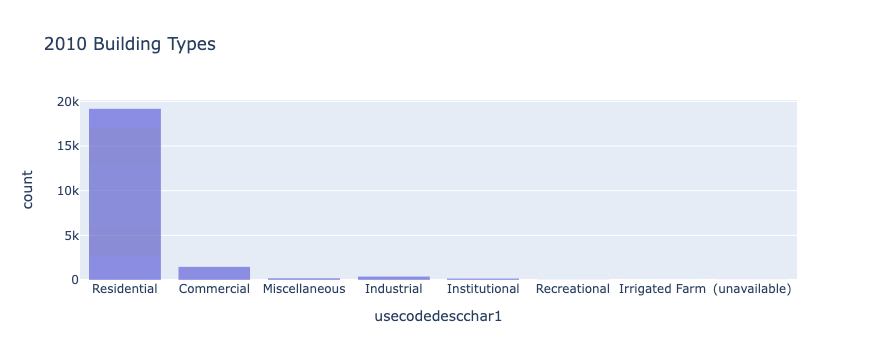

In [28]:
# a simple bar chart, putting date on the x-axis
fig = px.bar(df,
       x='usecodedescchar1',
       title='2010 Building Types'
      )

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()


### Here we use the same data frame and produce the same bar charts but, we adjust fort the labels. 

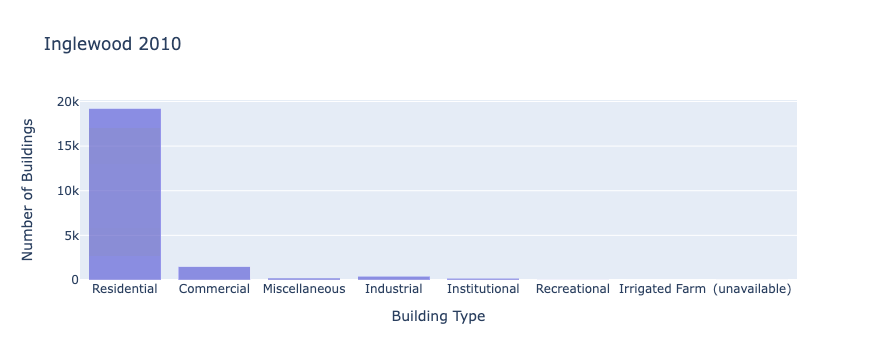

In [29]:
# add labels by providing a dict
fig = px.bar(
        df,
        x='usecodedescchar1',
        title='Inglewood 2010',
        labels={
            'usecodedescchar1':'Building Type',
            'count':'Number of Buildings'
        }
)

# get rid of white lines inside the bars
fig.update_traces(marker_line_width=0)

# show the figure
fig.show()

### I'm calling for the unique values within the colum of Year Built in my data.

In [31]:
df.yearbuilt.unique().tolist()

['0',
 '1953',
 '1947',
 '1983',
 '1939',
 '1948',
 '1943',
 '1962',
 '1944',
 '1940',
 '1941',
 '1946',
 '1942',
 '1945',
 '1949',
 '1967',
 '1936',
 '1938',
 '1937',
 '1931',
 '1930',
 '1956',
 '1960',
 '1951',
 '1957',
 '1984',
 '1988',
 '1999',
 '1950',
 '1958',
 '1952',
 '1954',
 '1963',
 '1994',
 '1935',
 '1955',
 '1959',
 '1932',
 '1927',
 '1981',
 '1965',
 '1933',
 '1974',
 '1968',
 '1921',
 '1923',
 '1995',
 '1987',
 '1926',
 '1961',
 '1969',
 '1964',
 '1975',
 '1925',
 '1973',
 '2007',
 '1971',
 '1922',
 '2004',
 '1980',
 '1928',
 '1970',
 '1929',
 '1924',
 '1934',
 '2003',
 '2002',
 '1918',
 '1978',
 '1966',
 '1911',
 '1991',
 '2000',
 '1909',
 '1920',
 '1989',
 '1914',
 '1915',
 '1916',
 '1993',
 '1917',
 '23',
 '1977',
 '1992',
 '1998',
 '24',
 '1985',
 '1996',
 '1979',
 '1990',
 '1997',
 '1972',
 '88',
 '2006',
 '2008',
 '1910',
 '1986',
 '1976',
 '1982',
 '1905',
 '98',
 '1908',
 '1913',
 '1919',
 '1904',
 '85',
 '1906',
 '1903',
 '1912',
 '1902',
 '1907',
 '1901',
 '87'

In [34]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21281 entries, 0 to 21280
Data columns (total 51 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   situszip                   21281 non-null  object
 1   taxratearea_city           21281 non-null  object
 2   ain                        21281 non-null  object
 3   rollyear                   21281 non-null  object
 4   taxratearea                21281 non-null  object
 5   assessorid                 21281 non-null  object
 6   usetype                    21281 non-null  object
 7   usecode                    21281 non-null  object
 8   usecodedescchar1           21281 non-null  object
 9   usecodedescchar2           21281 non-null  object
 10  usecodedescchar3           21281 non-null  object
 11  usecodedescchar4           21281 non-null  object
 12  totbuildingdatalines       21281 non-null  object
 13  yearbuilt                  21281 non-null  object
 14  effect

,situszip,taxratearea_city,ain,rollyear,taxratearea,assessorid,usetype,usecode,usecodedescchar1,usecodedescchar2,...,situsdirection,situsstreet,situsunit,situscity,rowid,center_lat,center_lon,location_1,propertylocation,situszip5
0,,INGLEWOOD,4015022025,2010,04569,4015-022-025,VAC,010V,Residential,Single Family Residence,...,,,,,20104015022025,33.97007775,-118.34476830,"{'latitude': '33.97007775', 'longitude': '-118...",NaN,NaN
1,,INGLEWOOD,4014012012,2010,13268,4014-012-012,VAC,100V,Commercial,Commercial,...,,,,,20104014012012,33.97646424,-118.35692763,"{'latitude': '33.97646424', 'longitude': '-118...",NaN,NaN
2,,INGLEWOOD,4016030900,2010,04568,4016-030-900,OTH,8800,Miscellaneous,Government Owned Property,...,,,,,20104016030900,33.96540441,-118.35442953,"{'latitude': '33.96540441', 'longitude': '-118...",NaN,NaN
3,,INGLEWOOD,4018005012,2010,04571,4018-005-012,C/I,3000,Industrial,Industrial,...,,,,,20104018005012,33.96639896,-118.36500501,"{'latitude': '33.96639896', 'longitude': '-118...",NaN,NaN
4,,INGLEWOOD,4017030011,2010,13268,4017-030-011,VAC,300V,Industrial,Industrial,...,,,,,20104017030011,33.96944423,-118.35961817,"{'latitude': '33.96944423', 'longitude': '-118...",NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21276,90301-4410,INGLEWOOD,4128025022,2010,04559,4128-025-022,C/I,1700,Commercial,Office Building,...,S,LA CIENEGA BLVD,,INGLEWOOD CA,20104128025022,33.95042022,-118.36979808,"{'latitude': '33.95042022', 'longitude': '-118...",9300 S LA CIENEGA BLVD INGLEWOOD CA 90301,90301
21277,90301-4423,INGLEWOOD,4128026016,2010,05230,4128-026-016,C/I,2720,Commercial,Parking Lot (Commercial Use Property),...,S,LA CIENEGA BLVD,,INGLEWOOD CA,20104128026016,33.94590416,-118.36926221,"{'latitude': '33.94590416', 'longitude': '-118...",9920 S LA CIENEGA BLVD INGLEWOOD CA 90301,90301
21278,90301-4423,INGLEWOOD,4128026008,2010,05230,4128-026-008,C/I,1707,Commercial,Office Building,...,S,LA CIENEGA BLVD,,INGLEWOOD CA,20104128026008,33.94591704,-118.36971998,"{'latitude': '33.94591704', 'longitude': '-118...",9920 S LA CIENEGA BLVD INGLEWOOD CA 90301,90301
21279,,INGLEWOOD,4128025021,2010,05230,4128-025-021,C/I,3100,Industrial,Light Manufacturing,...,,,,,20104128025021,33.94908368,-118.36971976,"{'latitude': '33.94908368', 'longitude': '-118...",NaN,NaN


## Now - lets group some data 

We can group data by calling on a column name to see the distinct values produced and accounted for within those values.

In [52]:
df.groupby(['usecodedescchar1']).count()

,situszip,taxratearea_city,ain,rollyear,taxratearea,assessorid,usetype,usecode,usecodedescchar2,usecodedescchar3,...,situsdirection,situsstreet,situsunit,situscity,rowid,center_lat,center_lon,location_1,propertylocation,situszip5
usecodedescchar1,,,,,,,,,,,,,,,,,,,,,
(unavailable),6,6,6,6,6,6,6,6,6,6,...,6,6,6,6,6,5,5,5,0,0
Commercial,1447,1447,1447,1447,1447,1447,1447,1447,1447,1447,...,1447,1447,1447,1447,1447,1447,1447,1447,1350,1350
Industrial,358,358,358,358,358,358,358,358,358,358,...,358,358,358,358,358,358,358,358,325,325
Institutional,133,133,133,133,133,133,133,133,133,133,...,133,133,133,133,133,133,133,133,129,129
Irrigated Farm,1,1,1,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
Miscellaneous,165,165,165,165,165,165,165,165,165,165,...,165,165,165,165,165,163,163,163,41,41
Recreational,16,16,16,16,16,16,16,16,16,16,...,16,16,16,16,16,16,16,16,16,16
Residential,19155,19155,19155,19155,19155,19155,19155,19155,19155,19155,...,19155,19155,19155,19155,19155,19155,19155,19155,18986,18986


In [72]:
df_grouped=df.groupby(['usecodedescchar1','effectiveyearbuilt']).count()[['assessorid']]
df_grouped.tail(50)

assessorid
usecodedescchar1 effectiveyearbuilt            
Residential      1960                       434
                 1961                       316
                 1962                       298
                 1963                       274
                 1964                       606
                 1965                       464
                 1966                       229
                 1967                       133
                 1968                       102
                 1969                        96
                 1970                       145
                 1971                        84
                 1972                        59
                 1973                       188
                 1974                        45
                 1975                        52
                 1976                         9
                 1977                       182
                 1978                        26
                 1979                        82
                 1980                        76
                 1981                       128
                 1982                        98
                 1983                        62
                 1984                       141
                 1985                       103
                 1986                       384
                 1987                       221
                 1988                       162
                 1989                       327
                 1990                       105
                 1991                        56
                 1992                        70
                 1993                        51
                 1994                        12
                 1995                        23
                 1996                        12
                 1997                         7
                 1998                         8
                 1999                        41
                 2000                        30
                 2001                        10
                 2002                        22
                 2003                        10
                 2004                        14
                 2005                       207
                 2006                       196
                 2007                        55
                 2008                        11
                 2009                         3

### Flattening the Data now 

In [73]:
df_flat = df_grouped.reset_index()
df_flat

,usecodedescchar1,effectiveyearbuilt,assessorid
0,(unavailable),0,6
1,Commercial,0,175
2,Commercial,1916,1
3,Commercial,1922,2
4,Commercial,1923,2
...,...,...,...
330,Residential,2005,207
331,Residential,2006,196
332,Residential,2007,55
333,Residential,2008,11


In [74]:
df_flat = df_flat.rename(columns={'assessorid':'count'})
df_flat

,usecodedescchar1,effectiveyearbuilt,count
0,(unavailable),0,6
1,Commercial,0,175
2,Commercial,1916,1
3,Commercial,1922,2
4,Commercial,1923,2
...,...,...,...
330,Residential,2005,207
331,Residential,2006,196
332,Residential,2007,55
333,Residential,2008,11


In [77]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21281 entries, 0 to 21280
Data columns (total 51 columns):
 #   Column                     Non-Null Count  Dtype 
---  ------                     --------------  ----- 
 0   situszip                   21281 non-null  object
 1   taxratearea_city           21281 non-null  object
 2   ain                        21281 non-null  object
 3   rollyear                   21281 non-null  object
 4   taxratearea                21281 non-null  object
 5   assessorid                 21281 non-null  object
 6   usetype                    21281 non-null  object
 7   usecode                    21281 non-null  object
 8   usecodedescchar1           21281 non-null  object
 9   usecodedescchar2           21281 non-null  object
 10  usecodedescchar3           21281 non-null  object
 11  usecodedescchar4           21281 non-null  object
 12  totbuildingdatalines       21281 non-null  object
 13  yearbuilt                  21281 non-null  object
 14  effect

## Creating a Mini Data Frame 

This is done to be able to establish a smaller cohesive data frame that we can reference and work with.

In [78]:
df_mini = df[['ain','usecodedescchar1','effectiveyearbuilt','roll_impvalue','center_lat','center_lon']]

In [79]:
df_mini.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21281 entries, 0 to 21280
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   ain                 21281 non-null  object
 1   usecodedescchar1    21281 non-null  object
 2   effectiveyearbuilt  21281 non-null  object
 3   roll_impvalue       21281 non-null  object
 4   center_lat          21278 non-null  object
 5   center_lon          21278 non-null  object
dtypes: object(6)
memory usage: 997.7+ KB


In [80]:
df_mini['center_lat'] = df_mini['center_lat'].astype(float)
df_mini['center_lon'] = df_mini['center_lon'].astype(float)
df_mini.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21281 entries, 0 to 21280
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   ain                 21281 non-null  object 
 1   usecodedescchar1    21281 non-null  object 
 2   effectiveyearbuilt  21281 non-null  object 
 3   roll_impvalue       21281 non-null  object 
 4   center_lat          21278 non-null  float64
 5   center_lon          21278 non-null  float64
dtypes: float64(2), object(4)
memory usage: 997.7+ KB


/tmp/ipykernel_194/3862657239.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_194/3862657239.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



# Plotting Using Scatter Map Box 

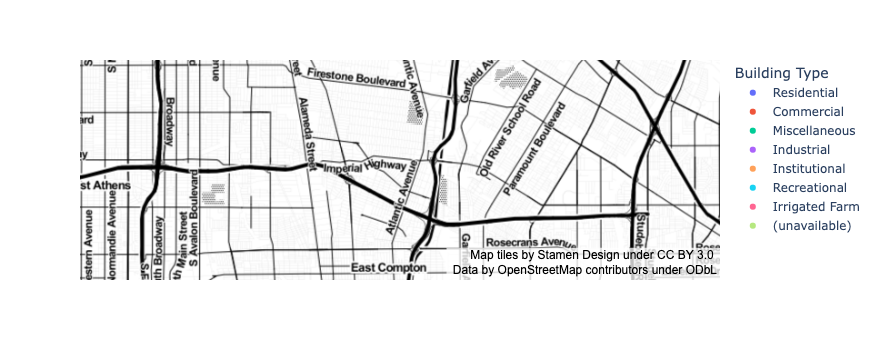

In [81]:
fig = px.scatter_mapbox(df_mini, 
                        lat="center_lat", 
                        lon="center_lon", 
                        color="usecodedescchar1",
                        labels={'usecodedescchar1':'Building Type'}
                       )

fig.update_layout(mapbox_style="stamen-toner")

fig.show()

In [85]:
building_type_list = df_mini.usecodedescchar1.unique().tolist()
building_type_list

['Residential',
 'Commercial',
 'Miscellaneous',
 'Industrial',
 'Institutional',
 'Recreational',
 'Irrigated Farm',
 '(unavailable)']

# Plotting after defining for distinct types of buildings 

In [89]:

def building_map(building='Residential'):
    
    fig = px.scatter_mapbox(
                            df_mini[df_mini.usecodedescchar1==building], 
                            lat="center_lat", 
                            lon="center_lon", 
                            color="usecodedescchar1",
                            labels={'usecodedescchar1':'Building Type'}
                           )

    fig.update_layout(mapbox_style="stamen-toner")

    fig.show()

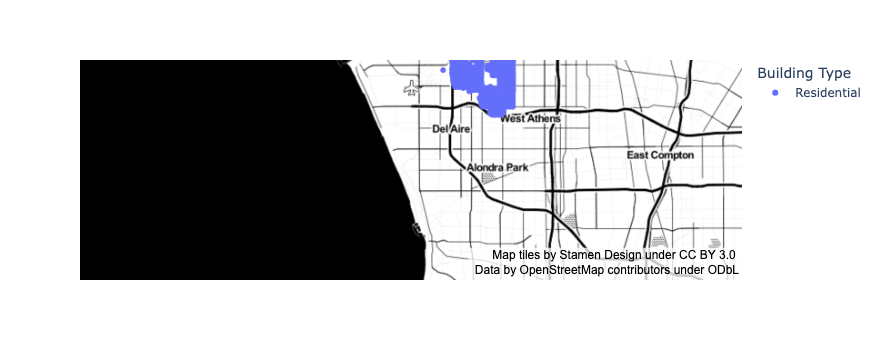

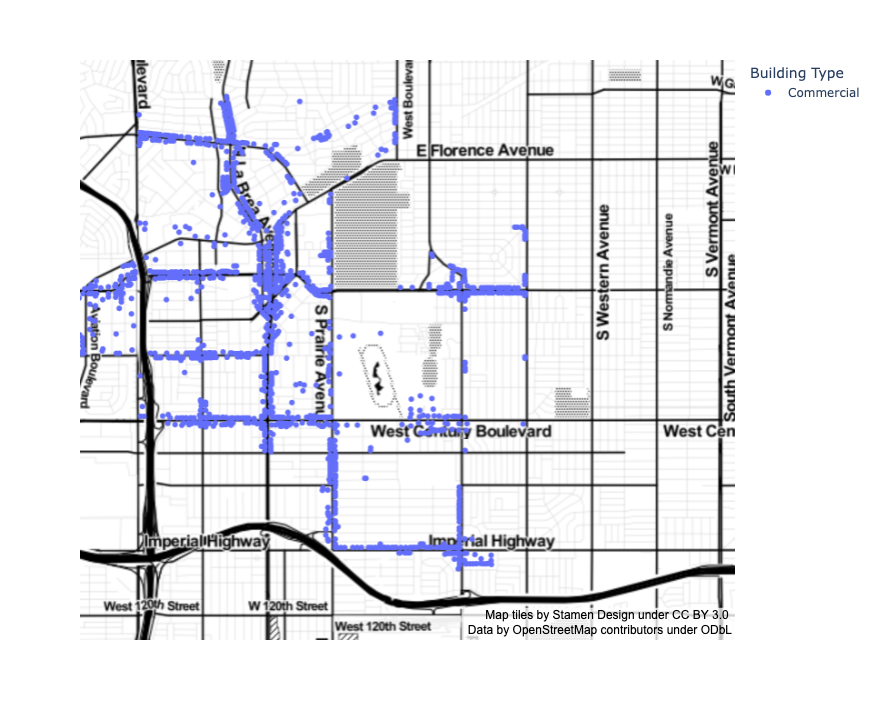

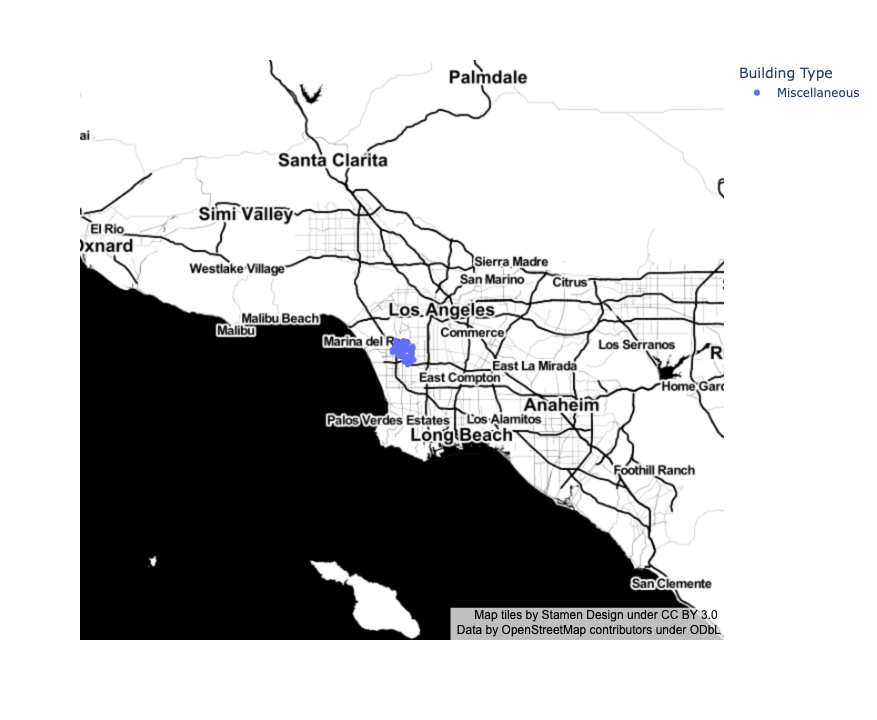

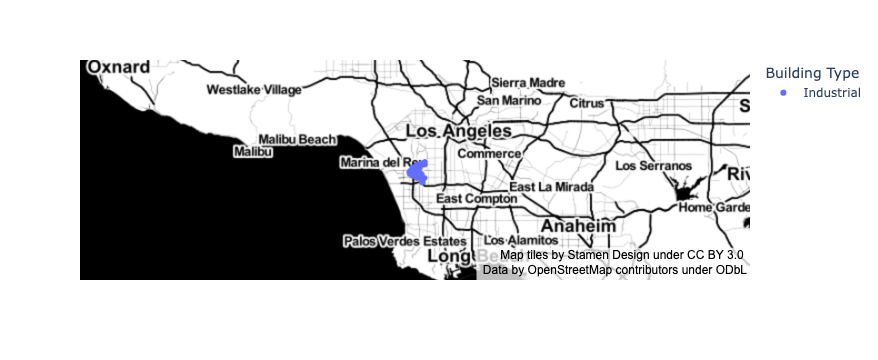

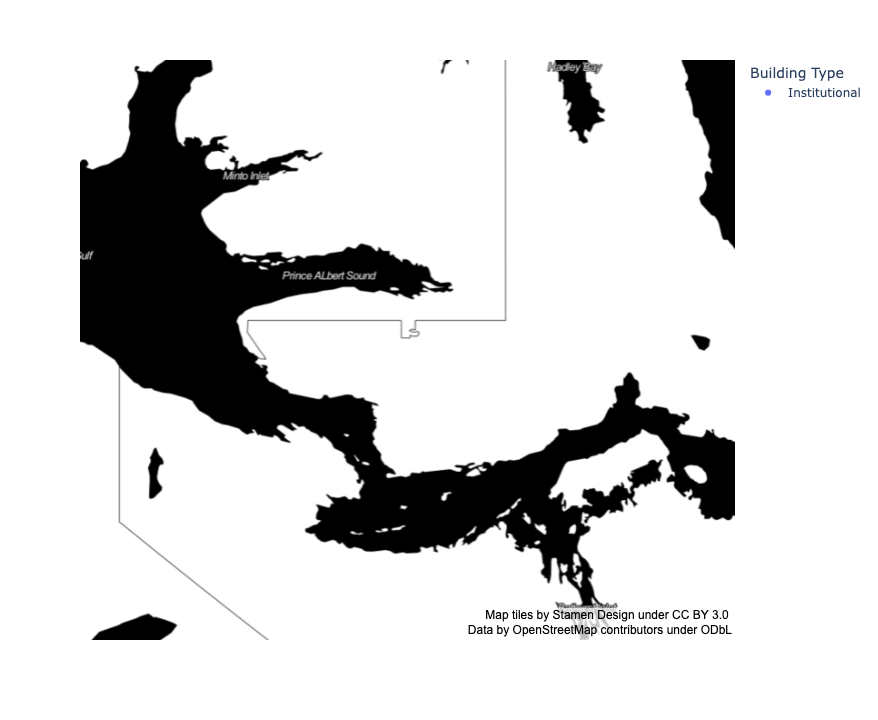

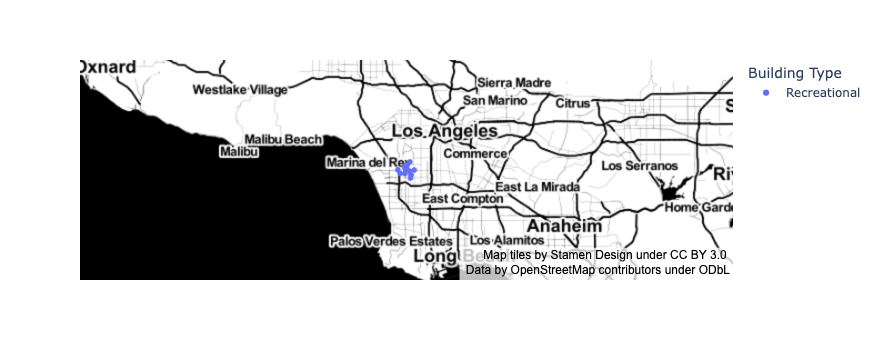

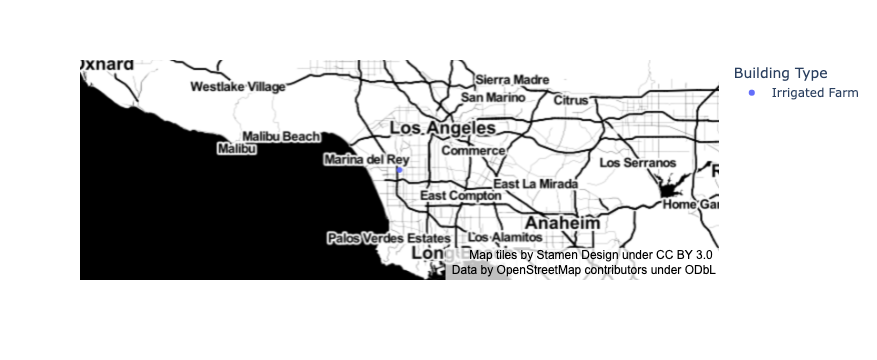

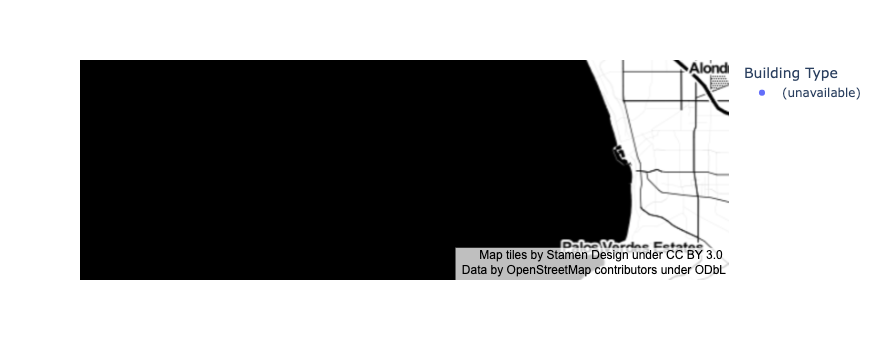

In [90]:
for building in building_type_list:
    building_map(building)

## Group Dynamics 

Nelson spearheaded most of the data analysis and project deliverables for this portion of the project. He was able to become familiar with the python language and code regarding the commands and reproduction of maps. I attempted to do the same, but I was not as succesful as he was and struggled with portions of the python code.
I essentially was able to code my part - but needed assistance from my team partner. One of the only wins at this point in my part was being able to find a source of our data, but we are still trying to become more familiar with the capacity of analysis we can conduct using it. It's a lot of data. We both agreed on the presentation format, content and anaylisis presenation. Nelson also updated our read me file for the proposal to include the assessors portal API and deleting old unnecessary data (census tract boundaries).